# Libraries

In [1]:
import cv2
import subprocess
import os, gc, glob
# import numpy as np
import cupy as np
import pandas as pd
import datatable as dtable
from numba import njit
from tqdm.notebook import tqdm
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

# Read Event Data

In [2]:
file = dtable.fread('../input/davis-240c-datasets/shapes_rotation/events.txt', sep = ' ').to_pandas()
file.columns = ['timestamp', 'x', 'y', 'polarity']
file['polarity'] *= 1
file.head()

,timestamp,x,y,polarity
0,0.000000,33,39,1
1,0.000011,158,145,1
2,0.000050,88,143,0
3,0.000055,174,154,0
4,0.000080,112,139,1


In [3]:
file.describe()

,timestamp,x,y,polarity
count,2.312629e+07,2.312629e+07,2.312629e+07,2.312629e+07
mean,3.489797e+01,1.296182e+02,9.755328e+01,4.304008e-01
std,1.571532e+01,6.579827e+01,4.848361e+01,4.951323e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.267385e+01,7.200000e+01,5.700000e+01,0.000000e+00
50%,3.651968e+01,1.360000e+02,1.020000e+02,0.000000e+00
75%,4.820719e+01,1.860000e+02,1.380000e+02,1.000000e+00
max,5.979839e+01,2.390000e+02,1.790000e+02,1.000000e+00


# Generate Superframes

**Reference:** 

N. Khan, K. Iqbal and M. G. Martini, "Time-Aggregation-Based Lossless Video Encoding for Neuromorphic Vision Sensor Data," in IEEE Internet of Things Journal, vol. 8, no. 1, pp. 596-609, 1 Jan.1, 2021.

In [4]:
def event_agg(timestamp, x, y, polarity, T_r, M, N):
    T_seq = timestamp.max()
    T_frames = int((T_seq // T_r)) + 1
    
    frames_0 = np.zeros((T_frames, M, N)) # polarity == 0
    frames_1 = np.zeros((T_frames, M, N)) # polarity == 1
    
    for i in tqdm(range(T_frames)):
        idx_0 = np.where((timestamp >= i * T_r) & (timestamp < i * T_r + T_r) & (polarity == 0))[0]
        if len(idx_0) > 0:
            frames_0[i] = np.bincount(N * x[idx_0] + y[idx_0], minlength = M * N).reshape(M, N)
        
        idx_1 = np.where((timestamp >= i * T_r) & (timestamp < i * T_r + T_r) & (polarity == 1))[0]
        if len(idx_1) > 0:
            frames_1[i] = np.bincount(N * x[idx_1] + y[idx_1], minlength = M * N).reshape(M, N)
    
    superframes = np.concatenate((frames_0, frames_1), axis = -1)
    print('generated superframes with size:', superframes.shape)
    return superframes

T_r: time intervel

M: image length

N: image width

In [5]:
T_r = 0.01
M = 240
N = 180

In [6]:
timestamp = np.array(file['timestamp'].values)
x = np.array(file['x'].values)
y = np.array(file['y'].values)
polarity = np.array(file['polarity'].values)
superframes = event_agg(timestamp, x, y, polarity, T_r, M, N)
superframes = superframes.get()

  0%|          | 0/5980 [00:00<?, ?it/s]

generated superframes with size: (5980, 240, 360)


# Image

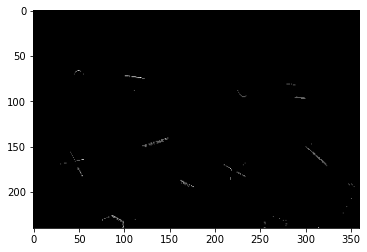

In [7]:
idx = np.random.randint(superframes.shape[0]).get()
plt.imshow(superframes[idx], cmap = cm.Greys_r)
plt.show()

# Video

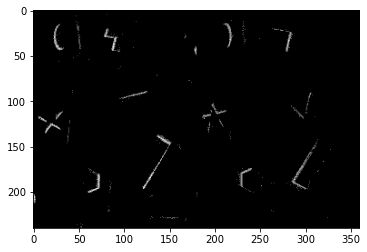

In [8]:
frames = [] # for storing the generated images
fig = plt.figure()
for i in range(1000):
    frames.append([plt.imshow(superframes[i], cmap = cm.Greys_r, animated = True)])

ani = animation.ArtistAnimation(fig, frames, interval = 50, blit = False, repeat_delay = 1000)
ani.save('video.mp4')
HTML(ani.to_jshtml())